<a href="https://colab.research.google.com/github/abhro29122/Dog-Breed-Classification-using-Mobile-NetV2/blob/main/dog_vision.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import pandas as pd

In [ ]:
import numpy as np

In [ ]:
##this is a collab notebook

In [ ]:
#nzip "/content/drive/MyDrive/dog vision/dog-breed-identification.zip"

In [ ]:
#end to end multi class dog breed classification
#this notebook builds an end to end multi-class image classifier using tensorflow 2.0 and tensorflow hub

In [ ]:
# @title Default title text

##problem
##problem
#identyfing the breed of a dog given an image of a dog.

#data
#the data we are using is from kaggle's dog breed
#identification competition.


#evaluation
#the evaluation is a file with prediction probabilities for each dog breed of each test image.

#features
#some info about the data:
#*we are dealing with images(unstructured data) probably best we use deep learning/transfer Learning
#*there are 120 different breeds of dialogs
#*there are around 10,000 + images in the training sets(these images have labels)
#*there are around 10,000 + images in the test set.(these image have no labels,bcoz we will want to predict them)


#evaluation
#the evaluation is a file with prediction probabilities for each dog breed of each test image.

#features
#some info about the data:
#*we are dealing with images(unstructured data) probably best we use deep learning/transfer Learning
#*there are 120 different breeds of dialogs
#*there are around 10,000 + images in the training sets(these images have labels)
#*there are around 10,000 + images in the test set.(these image have no labels,bcoz we will want to predict them)


In [ ]:
#import tensor flow in colab
import tensorflow as tf
print("TensorFlow version:", tf.__version__)




TensorFlow version: 2.20.0


In [ ]:
#import necessary tools
import tensorflow_hub as hub
print("TF version",tf.__version__)

TF version 2.20.0


In [ ]:
print("TF HUB VERSION:",hub.__version__)

TF HUB VERSION: 0.16.1


In [ ]:
#check for gpu availability
print("GPU","available"if tf.config.list_physical_devices("GPU")else"not available")

GPU available


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import pandas as pd
labels_csv=pd.read_csv("drive/MyDrive/dog vision/labels.csv")


In [ ]:
print(labels_csv.head())

                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [ ]:
##getting our data ready
#with  all machine learning tools,our data has to be in numerical format.so thats what we will be doing first.turning our images into sensors.
#lets start by accessing our data and checking out thelabels

In [ ]:
#checkout the labels
import pandas as pd
labels_csv=pd.read_csv("drive/MyDrive/dog vision/labels.csv")

In [ ]:
print(labels_csv.describe())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     fff43b07992508bc822f33d8ffd902ae  scottish_deerhound
freq                                   1                 126


<Axes: xlabel='breed'>

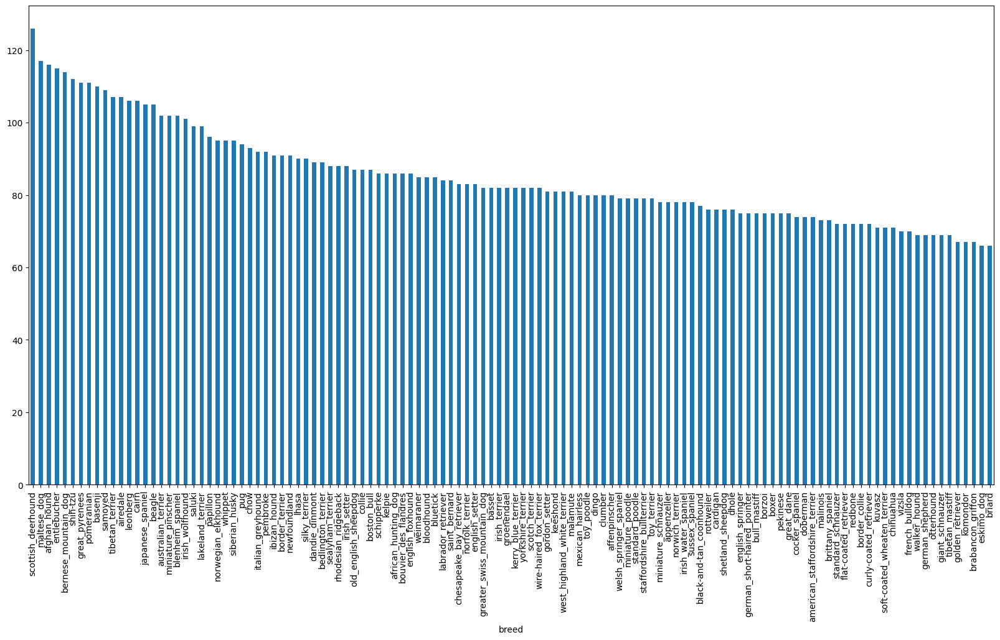

In [ ]:
labels_csv["breed"].value_counts().plot.bar(figsize=(20,10))

In [ ]:
labels_csv["breed"].value_counts().median()

82.0

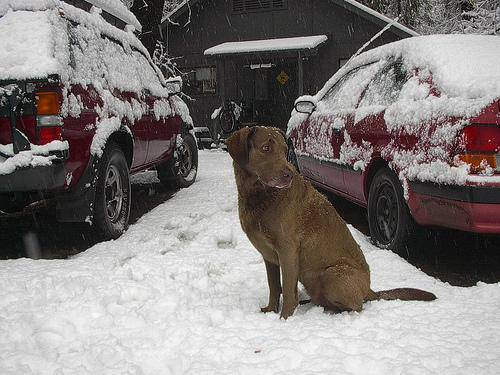

In [ ]:
#lets view an image
from IPython.display import Image
Image("/content/drive/MyDrive/dog vision/train/fff43b07992508bc822f33d8ffd902ae.jpg")


In [ ]:
#create pathnames from image ID,S
filenames=[fname for fname in labels_csv["id"]]
#check the first 10
filenames

['000bec180eb18c7604dcecc8fe0dba07',
 '001513dfcb2ffafc82cccf4d8bbaba97',
 '001cdf01b096e06d78e9e5112d419397',
 '00214f311d5d2247d5dfe4fe24b2303d',
 '0021f9ceb3235effd7fcde7f7538ed62',
 '002211c81b498ef88e1b40b9abf84e1d',
 '00290d3e1fdd27226ba27a8ce248ce85',
 '002a283a315af96eaea0e28e7163b21b',
 '003df8b8a8b05244b1d920bb6cf451f9',
 '0042188c895a2f14ef64a918ed9c7b64',
 '004396df1acd0f1247b740ca2b14616e',
 '0067dc3eab0b3c3ef0439477624d85d6',
 '00693b8bc2470375cc744a6391d397ec',
 '006cc3ddb9dc1bd827479569fcdc52dc',
 '0075dc49dab4024d12fafe67074d8a81',
 '00792e341f3c6eb33663e415d0715370',
 '007b5a16db9d9ff9d7ad39982703e429',
 '007b8a07882822475a4ce6581e70b1f8',
 '007ff9a78eba2aebb558afea3a51c469',
 '008887054b18ba3c7601792b6a453cc3',
 '008b1271ed1addaccf93783b39deab45',
 '008ba178d6dfc1a583617470d19c1673',
 '009509be3ca7cce0ff9e37c8b09b1125',
 '0097c6242c6f3071762d9f85c3ef1b2f',
 '00a338a92e4e7bf543340dc849230e75',
 '00a366d4b4a9bbb6c8a63126697b7656',
 '00a862390341c5be090dd72bd2bc19ef',
 

In [ ]:
filenames[:10]

['000bec180eb18c7604dcecc8fe0dba07',
 '001513dfcb2ffafc82cccf4d8bbaba97',
 '001cdf01b096e06d78e9e5112d419397',
 '00214f311d5d2247d5dfe4fe24b2303d',
 '0021f9ceb3235effd7fcde7f7538ed62',
 '002211c81b498ef88e1b40b9abf84e1d',
 '00290d3e1fdd27226ba27a8ce248ce85',
 '002a283a315af96eaea0e28e7163b21b',
 '003df8b8a8b05244b1d920bb6cf451f9',
 '0042188c895a2f14ef64a918ed9c7b64']

In [ ]:
filenames=["drive/MyDrive/dog vision/train/"+fname+ ".jpg" for fname in labels_csv["id"]]

In [ ]:
filenames

['drive/MyDrive/dog vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/dog vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/dog vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/dog vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/dog vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/dog vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/dog vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/dog vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/dog vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/dog vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg',
 'drive/MyDrive/dog vision/train/004396df1acd0f1247b740ca2b14616e.jpg',
 'drive/MyDrive/dog vision/train/0067dc3eab0b3c3ef0439477624d85d6.jpg',
 'drive/MyDrive/dog vision/train/00693b8bc2470375cc744a6391d397ec.jpg',
 'drive/MyDrive/dog vision/train/006cc3ddb9dc1bd827479569fcdc52d

In [ ]:
#check no of file names matches no of actual image files
import os
#check no of file names matches no of actual image files
import os
if len(os.listdir("drive/My Drive/dog vision/train/")) == len(filenames):
  print("Filenames match actual amount of files!!! proceeed")
else:
    print("filenames do not match actual amount of files,check the target directory")

filenames do not match actual amount of files,check the target directory


In [ ]:
len(filenames)

10222

In [ ]:
len(os.listdir("drive/My Drive/dog vision/train/"))

10186

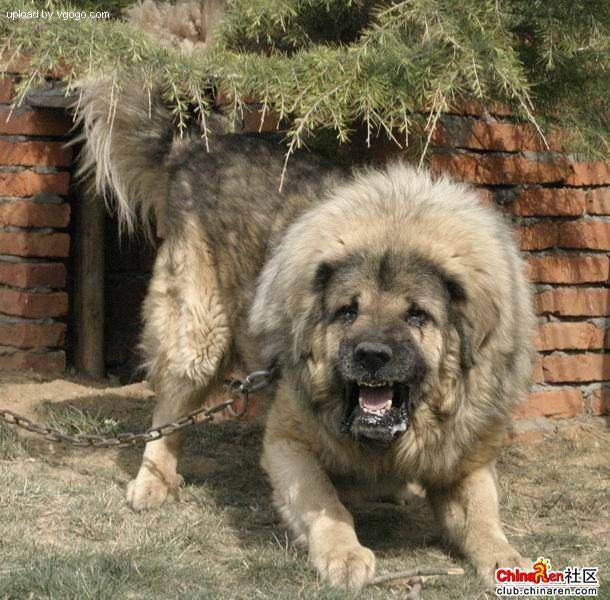

In [ ]:
Image(filenames[9000])

In [ ]:
labels_csv["breed"][9000]

'tibetan_mastiff'

In [ ]:
import numpy as np
labels=labels_csv["breed"].to_numpy()
labels=np.array(labels)
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
len(labels)

10222

In [ ]:
#see if no of labels matches the no of filenames
if len(labels)== len(filenames):
   print("no of labels matches no of filenames")
else:
  print("no  of labels does not match no of filenames")

no of labels matches no of filenames


In [ ]:
#find the unique label values
unique_breeds=np.unique(labels)
len(unique_breeds)
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [ ]:
#turn a singlew label into an array of booleans
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
#turn every label into a boolean array
boolean_labels=[labels ==unique_breeds for labels in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
len(boolean_labels)

10222

In [ ]:
#example: turning boolean arrays into integers
print(labels[0])
print(np.where(unique_breeds == labels[0]))#index where label occurs
print(boolean_labels[0].argmax())#index where labels occur in boolean array


boston_bull
(array([19]),)
19


In [ ]:
print(labels[2])
print(boolean_labels[2].astype(int))

pekinese
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
filenames[:10]

['drive/MyDrive/dog vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/dog vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/dog vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/dog vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/dog vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/dog vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/dog vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/dog vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/dog vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/dog vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
# @title Default title text
#create our own validation set
#since the dataset from kaggle doesnt come with a validation set , we are going to create our own

In [ ]:
#setup x and y variables
x= filenames
y=boolean_labels

In [ ]:
len(filenames)

10222

In [ ]:
#we are going to  start of experimenting with 1000 images as needed
#set no of images to use for experimenting
NUM_IMAGES = 1000 # @param {"type":"slider","min":1000,"max":10000,"step":1000}

In [ ]:
#lets split our data into train and validation sets
from sklearn.model_selection import train_test_split
#split into training and validation sets
x_train,x_val,y_train,y_val=train_test_split(x[:NUM_IMAGES],y[:NUM_IMAGES],test_size=0.2,random_state=42)
len(x_train),len(x_val),len(y_train),len(y_val)

(800, 200, 800, 200)

In [ ]:
#lets have a look
x_train[:5],
y_train[:5]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False,  True,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
x_train[:5]

['drive/MyDrive/dog vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
 'drive/MyDrive/dog vision/train/0d2f9e12a2611d911d91a339074c8154.jpg',
 'drive/MyDrive/dog vision/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
 'drive/MyDrive/dog vision/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
 'drive/MyDrive/dog vision/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg']

In [ ]:
#preprocessing images(images into tensors)
#To preprocess our images into tensors we are going to write a function which does a few things:
#1.take a image filepath as input
#2.use tensorflow to read a file and save it to a variable,'image'
#3.turn our 'image' (a jpg )into TensorS
#normalize our image(convert colour channels values from 0-255 to 0-1)
#4.resize the images to be a shape of (224,224)
#5.return the modified image



In [ ]:
#convert image to numpy
from matplotlib.pyplot import imread
image=imread(filenames[42])
image.shape


(257, 350, 3)

In [ ]:
image.max

<function ndarray.max>

In [ ]:
image.max(),image.min()

(np.uint8(255), np.uint8(0))

array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]],

       [[ 56, 104,  66],
        [ 58, 106,  68],
        [ 64, 112,  74],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 74, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  11],
        [  8,  14,  14],
        ...,
        [120, 113,  67],
        [126, 118,  71],
        [122, 114,  67]],

       [[  0,   3,   7],
        [  2,   7,  10],
        [  3,   9,   7],
        ...,
        [105,  98,  54],
        [112, 104,  58],
        [111, 103,  57]],

       [[ 16,  18,  30],
        [ 16,  19,  24],
        [ 15,  20,  14],
        ...,
        [101,  92,  51],
        [ 97,  88,  47],
        [120, 111,  70]]], dtype=uint8)
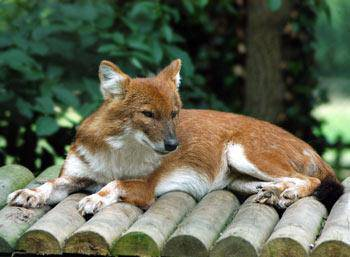

In [ ]:
image

In [ ]:
tf.constant(image)

<tf.Tensor: shape=(257, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]],

       [[ 56, 104,  66],
        [ 58, 106,  68],
        [ 64, 112,  74],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 74, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  11],
        [  8,  14,  14],
        ...,
        [120, 113,  67],
        [126, 118,  71],
        [122, 114,  67]],

       [[  0,   3,   7],
        [  2,   7,  10],
        [  3,   9,   7],
        ...,
        [105,  98,  54],
        [112, 104,  58],
        [111, 103,  57]],

       [[ 16,  18,  30],
        [ 16,  19,  24],
        [ 15,  20,  14],
        ...,
        [101,  92,  5

In [ ]:
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)>

In [ ]:
#tyrn image into a tensor
#lets make a function to preprocess them
IMG_SIZE= 224

#create a function for preprocesing images
def process_image(image_path,img_size=IMG_SIZE):
  "takes an image file path and turns the image into a tensor."
  #read in an image file
  image =tf.io.read_file(image_path)
  #turn the jpeg image into numerical tensor with 3 colour channels (red,green,blue)
  image=tf.image.decode_jpeg(image,channels=3)
  #convert the colour channel values from 0 -255 to 0-1 values
  image=tf.image.convert_image_dtype(image,tf.float32)
  #resize the image to our desired value
  image=tf.image.resize(image,size=[IMG_SIZE,IMG_SIZE])
  return image

In [ ]:
tensor=tf.io.read_file(filenames[26])
tensor

<tf.Tensor: shape=(), dtype=string, numpy=b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x00\x00\x01\x00\x01\x00\x00\xff\xdb\x00C\x00\n\x07\x07\x08\x07\x06\n\x08\x08\x08\x0b\n\n\x0b\x0e\x18\x10\x0e\r\r\x0e\x1d\x15\x16\x11\x18#\x1f%$"\x1f"!&+7/&)4)!"0A149;>>>%.DIC<H7=>;\xff\xdb\x00C\x01\n\x0b\x0b\x0e\r\x0e\x1c\x10\x10\x1c;("(;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;\xff\xc0\x00\x11\x08\x01\xf4\x01w\x03\x01"\x00\x02\x11\x01\x03\x11\x01\xff\xc4\x00\x1f\x00\x00\x01\x05\x01\x01\x01\x01\x01\x01\x00\x00\x00\x00\x00\x00\x00\x00\x01\x02\x03\x04\x05\x06\x07\x08\t\n\x0b\xff\xc4\x00\xb5\x10\x00\x02\x01\x03\x03\x02\x04\x03\x05\x05\x04\x04\x00\x00\x01}\x01\x02\x03\x00\x04\x11\x05\x12!1A\x06\x13Qa\x07"q\x142\x81\x91\xa1\x08#B\xb1\xc1\x15R\xd1\xf0$3br\x82\t\n\x16\x17\x18\x19\x1a%&\'()*456789:CDEFGHIJSTUVWXYZcdefghijstuvwxyz\x83\x84\x85\x86\x87\x88\x89\x8a\x92\x93\x94\x95\x96\x97\x98\x99\x9a\xa2\xa3\xa4\xa5\xa6\xa7\xa8\xa9\xaa\xb2\xb3\xb4\xb5\xb6\xb7\xb8\xb9\xba\xc2\xc3\xc4\xc5\xc6\xc7\xc8\xc9\xca

In [ ]:
tf.image.decode_jpeg(tensor,channels=3)

<tf.Tensor: shape=(500, 375, 3), dtype=uint8, numpy=
array([[[ 59,  68,  65],
        [ 64,  73,  70],
        [ 71,  80,  77],
        ...,
        [115, 128, 108],
        [115, 128, 108],
        [110, 123, 103]],

       [[ 65,  74,  71],
        [ 72,  81,  78],
        [ 79,  88,  85],
        ...,
        [114, 127, 107],
        [117, 130, 110],
        [116, 129, 109]],

       [[ 68,  77,  74],
        [ 76,  85,  82],
        [ 83,  92,  89],
        ...,
        [114, 127, 107],
        [120, 133, 113],
        [123, 136, 116]],

       ...,

       [[173, 200, 155],
        [164, 179, 136],
        [181, 166, 133],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[142, 159, 117],
        [147, 154, 113],
        [189, 174, 141],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[167, 179, 139],
        [167, 172, 132],
        [204, 188, 155],
        ...,
        [255, 255, 25

In [ ]:
# Decode the jpeg image into a numerical tensor
decoded_tensor = tf.image.decode_jpeg(tensor, channels=3)

# Convert the colour channel values from 0-255 to 0-1 values
tf.image.convert_image_dtype(decoded_tensor, tf.float32)

<tf.Tensor: shape=(500, 375, 3), dtype=float32, numpy=
array([[[0.23137257, 0.26666668, 0.25490198],
        [0.2509804 , 0.28627452, 0.27450982],
        [0.2784314 , 0.3137255 , 0.3019608 ],
        ...,
        [0.45098042, 0.5019608 , 0.42352945],
        [0.45098042, 0.5019608 , 0.42352945],
        [0.43137258, 0.48235297, 0.4039216 ]],

       [[0.25490198, 0.2901961 , 0.2784314 ],
        [0.28235295, 0.31764707, 0.30588236],
        [0.30980393, 0.34509805, 0.33333334],
        ...,
        [0.44705886, 0.49803925, 0.41960788],
        [0.45882356, 0.50980395, 0.43137258],
        [0.454902  , 0.5058824 , 0.427451  ]],

       [[0.26666668, 0.3019608 , 0.2901961 ],
        [0.29803923, 0.33333334, 0.32156864],
        [0.3254902 , 0.36078432, 0.34901962],
        ...,
        [0.44705886, 0.49803925, 0.41960788],
        [0.47058827, 0.52156866, 0.4431373 ],
        [0.48235297, 0.53333336, 0.454902  ]],

       ...,

       [[0.6784314 , 0.7843138 , 0.60784316],
        [0.64

In [ ]:
#turning our data into batches
#why turn our data into batches?

#lets say u are trying to process 10,000 + images in one go... they all might not fit into memory

#so thats why we do about 32(batch size) images at a time (you can manually adjust the batch size if need be)

#in order to use tensorflow effectively , we need our data in the form of tensortuples which look like this:
'(image,label)'


'(image,label)'

In [ ]:
#create a simple function to return a tuple(image,label)
def get_image_label(image_path,label):
  """thakes an image file path name and the asociated label,
  processes the image and returns a tuple of(image,label)."""
  image =process_image(image_path)
  return image,label

In [ ]:
#demo of the above
(process_image(x[42]),tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

In [ ]:
#now we have got a way to turn our data into tuples of tensors
#in the form '(image,label)',lets make a function to turn all of our data('x' and 'y')into batches

In [ ]:
#define the batch size,32 is a good start
BATCH_SIZE=32
#Create a function to turn data into batches
def create_data_batches(x,y=None,batch_size=BATCH_SIZE,valid_data=False,test_data=False):
  """
  creates batches of data of image(x) and label (y) pairs.
  shufles the data if its training data but doesnt shuffle if its validation data
  also accept test data as input
  """
  #if the data is a test dataset ,we probably dont have any labels
  if test_data:
    print("creating test data batches...")
    data=tf.data.Dataset.from_tensor_slices((tf.constant(x)))#only filepaths(no labels)tf.const turns x into tensors
    data_batch=data.map(process_image).batch(BATCH_SIZE)
    return data_batch
    #if the data is a valid dataset,we dont need to shuffle it
  elif valid_data:
    print("creating validation data  batches...")
    # Pass the tensors as a tuple
    data=tf.data.Dataset.from_tensor_slices((tf.constant(x),tf.constant(y)))#file paths #labels
    data=data.map(get_image_label)
    data_batch=data.batch(BATCH_SIZE)
    return data_batch
  else:
        print("creating training data batches...")
        #turn filepaths and labels into tensors
        # Pass the tensors as a tuple
        data=tf.data.Dataset.from_tensor_slices((tf.constant(x),tf.constant(y)))
        #shuffling pathnames and labels before mapping image processor function is faster than shuffling images
        data=data.shuffle(buffer_size=len(x))
        #create (image,label) tuples (this also turns the image paths into a preprocessed image)
        data_batch=data.map(get_image_label).batch(BATCH_SIZE)
        return data_batch

In [ ]:
#create training and validation batches
train_data=create_data_batches(x_train,y_train)
val_data=create_data_batches(x_val,y_val,valid_data=True)

creating training data batches...
creating validation data  batches...


In [ ]:
#check out the diffn attributes of our data batches
train_data.element_spec,val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

In [ ]:
y[0]

array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
##visualizing data batches

In [ ]:
#our data is now in batches ,however,these can be a little hard to understand/comprehend lets visualize them

In [ ]:
import matplotlib.pyplot as plt
#create a function for viewing images in a data batch
def show_25_images(images,labels):
  """
  displays a plot of 25 images and their labels from a data batch
  """
  #setup the figure
  plt.figure(figsize=(10,10))
  #loop through 25( for displaying 25 images)
  for i in range(25):
    #create subplots(5 rows,5 columns)
    ax=plt.subplot(5,5,i+1)
    #display an image
    plt.imshow(images[i])
    #add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    #turn the grid lines off
    plt.axis("off")

In [ ]:
train_images,train_labels=next(train_data.as_numpy_iterator())

In [ ]:
train_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
train_images

array([[[[0.806629  , 0.8536878 , 0.9164329 ],
         [0.7959147 , 0.84297353, 0.9057186 ],
         [0.8045844 , 0.8516432 , 0.9143883 ],
         ...,
         [0.466072  , 0.4778367 , 0.43508697],
         [0.46931523, 0.48107994, 0.45276603],
         [0.9843138 , 0.9921569 , 0.978494  ]],

        [[0.7957046 , 0.8427634 , 0.9055085 ],
         [0.82304054, 0.87009937, 0.93284446],
         [0.80955136, 0.8566102 , 0.9193553 ],
         ...,
         [0.46135882, 0.47633108, 0.42385116],
         [0.46904635, 0.48081106, 0.45195937],
         [0.9843138 , 0.9934637 , 0.9712423 ]],

        [[0.80708915, 0.854148  , 0.91689306],
         [0.8016882 , 0.848747  , 0.9114921 ],
         [0.7891119 , 0.83617073, 0.8989158 ],
         ...,
         [0.46078482, 0.46862796, 0.413866  ],
         [0.47226757, 0.4801107 , 0.43557274],
         [0.9906163 , 0.9945379 , 0.9675446 ]],

        ...,

        [[0.53872305, 0.6759779 , 0.41652417],
         [0.5568215 , 0.6940764 , 0.43462268]

In [ ]:
train_labels

array([[False,  True, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       ...,
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False]])

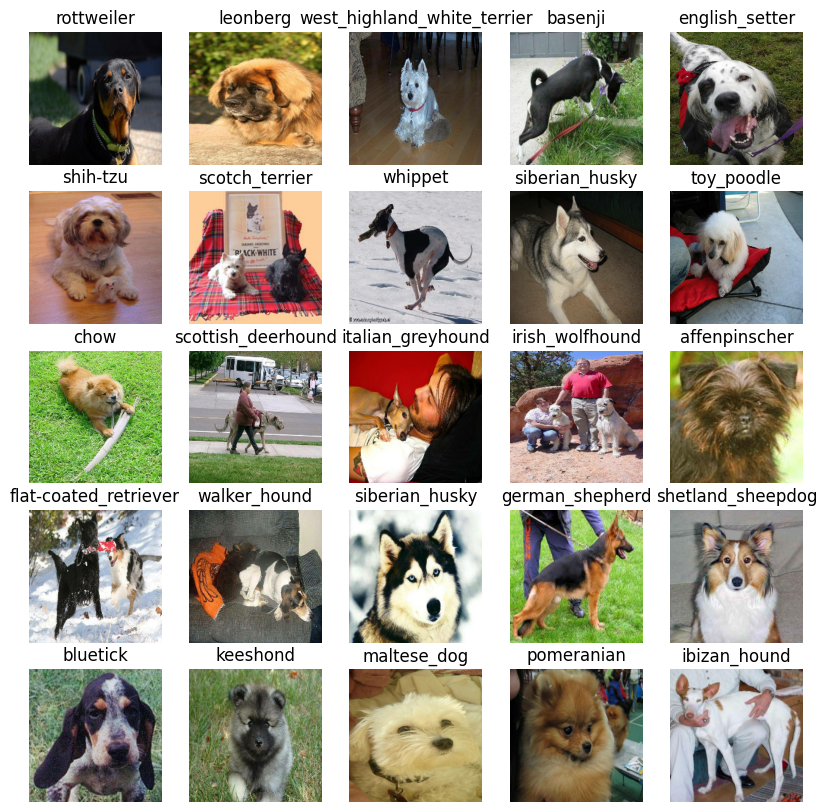

In [ ]:
#now lets visualize the data in a training natch
train_images,train_labels=next(train_data.as_numpy_iterator())
show_25_images(train_images,train_labels)

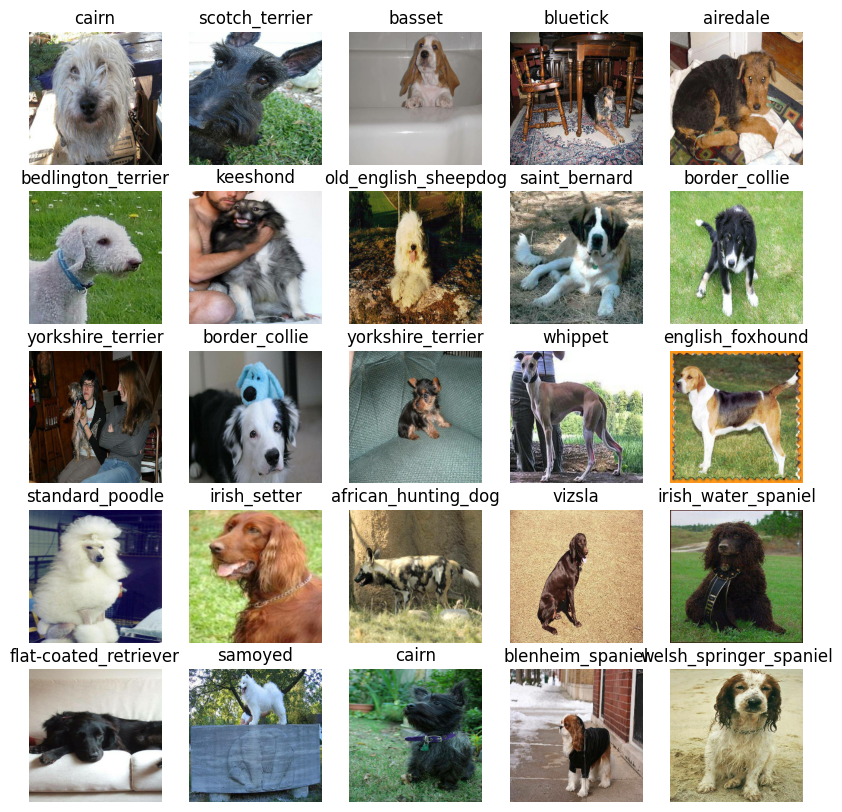

In [ ]:
#now lets visualize our validation set
val_images,val_labels=next(val_data.as_numpy_iterator())
show_25_images(val_images,val_labels)

In [ ]:
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [ ]:
##building a model
#before we build a model,there are a few things we need to define:
#*the input shape(our image labels, in the form of Tensors )of our model.
#*the output shape(image labels,in the form of tensors)of our model.
#*the url of the model we want to use from tensorflow hub.

NOW we have got our inputs,outputs and models ready to go.
lets put them together into a keras deep learning model
knowing this ,lets create a function which:
*takes the input shape,output shape and the model we have chosen as parameters.
*defines the layers in a keras model in sequential fashion (do this first,then this ,then that).
*builds the model(tells the model the input shape it will be getting).
*returns the model


In [ ]:
#setup input shape to the model
INPUT_SHAPE=[IMG_SIZE,IMG_SIZE,3]#BATCH,HEIGHT,WIDTH,COLOUR CHANNELS
#setup output shape of our model
OUTPUT_SHAPE=len(unique_breeds)
#setup model url from tensorflow hub
import tensorflow_hub as hub
MODEL_URL = "https://tfhub.dev/google/tf2-preview/mobilenet_v2/feature_vector/4"



In [ ]:
INPUT_SHAPE,OUTPUT_SHAPE

([224, 224, 3], 120)

In [ ]:
import os
os.environ["TF_USE_LEGACY_KERAS"] = "1"

# Now import in this exact order
import tensorflow_hub as hub
import tf_keras as keras
import tensorflow as tf

# Verify - hub should now bind to tf_keras
print(hub.KerasLayer.__bases__)  # Should reference tf_keras layers

(<class 'tf_keras.src.engine.base_layer.Layer'>,)


In [ ]:
#create a function which builds a keras model
import tf_keras as keras
def create_model(input_shape=INPUT_SHAPE,output_shape=OUTPUT_SHAPE,model_url=MODEL_URL):
  print("Building model with:",input_shape,output_shape,model_url)
  #SETUP the model layers
  model=keras.Sequential([hub.KerasLayer(model_url, input_shape=input_shape, trainable=False),keras.layers.Dense(units=OUTPUT_SHAPE,activation="softmax")])
  #compile the model
  model.compile(loss=keras.losses.CategoricalCrossentropy(),
                optimizer=keras.optimizers.Adam(),
                metrics=["accuracy"])
  model.build([None, *input_shape])
  return model

In [ ]:
IMG_SIZE

224

In [ ]:
model=create_model()

Building model with: [224, 224, 3] 120 https://tfhub.dev/google/tf2-preview/mobilenet_v2/feature_vector/4


In [ ]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1280)              2257984   
                                                                 
 dense (Dense)               (None, 120)               153720    
                                                                 
Total params: 2411704 (9.20 MB)
Trainable params: 153720 (600.47 KB)
Non-trainable params: 2257984 (8.61 MB)
_________________________________________________________________


In [ ]:
outputs=np.ones(shape=(1,1,1280))
outputs

array([[[1., 1., 1., ..., 1., 1., 1.]]])

In [ ]:
## creating callbacks
#callbacks are helper function model can use during training to do such thing as save its progress,check its progress or stop training early if a model stops improving.
#we will create two calbacks,one for tensorboard which helps track our model progress and another for early stopping which prevents our model from training for too long.

In [ ]:
#tensorflow callback
#to setup tensorboard callback,we bneed to do three things:
#1. load the tensorboard notebook extension
#2.create a tensorflow callback which is able to save logs to a directory and pass it to our model 'fit()' function
#3.visualize our models training logs with the %tensorboard magic function
#load tensorBoard notebook extension
%load_ext tensorboard

import datetime
import tensorflow as tf
import os
import tf_keras as keras # Import tf_keras here

#create a func to build a tensorflowboard callback
def create_tensorboard_callback():
  #create a log directory for storing tensorboard logs
  logdir=os.path.join("drive/My Drive/dog vision/data/logs",datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  #make it so the logs get tracked whenever we run an experiment
  return keras.callbacks.TensorBoard(logdir, histogram_freq=1) # Added histogram_freq and used keras instead of tf_keras

In [ ]:
##early stopping call back
#early stopping helps stop our model from overfitting by stopping training if a certain evaluation metric stops improving.

In [ ]:
#create early stopping callback
early_stopping=keras.callbacks.EarlyStopping(monitor="val_accuracy",patience=3)

In [ ]:
##training a model(on subset of data)
#our first model is only going to train on 1000 images,to make sure evrything is working.

### Training a model (on subset of data)

Our first model is only going to train on 1000 images, to make sure everything is working.

In [ ]:
#pip install -U tensorflow

In [ ]:
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.callbacks import TensorBoard


In [ ]:
NUM_EPOCHS=100 #@param {type:"slider",min:10,max:100}

In [ ]:
#check to make sure we are still running on a GPU
print("GPU","available (yes!!!)" if tf.config.list_physical_devices("GPU")else "not available :" )

GPU available (yes!!!)


Let's create a function which:
* creates a model using `create_model()`
* sets up a TensorBoard callback using `create_tensorboard_callback()`
* calls the `fit()` function on our model passing it the training data, validation data, no of epochs to train for (`NUM_EPOCHS`) and the callbacks we would like to use
* returns the model

In [ ]:
# Build a function to train and return a trained model
def train_model():
  # Create a model
  model = create_model()
  # Create new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()
  # Fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])
  return model

In [ ]:
# Fit the model to the data
model = train_model()

Building model with: [224, 224, 3] 120 https://tfhub.dev/google/tf2-preview/mobilenet_v2/feature_vector/4
Epoch 1/100
25/25 [==============================] - 57s 280ms/step - loss: 4.2560 - accuracy: 0.1400 - val_loss: 3.3350 - val_accuracy: 0.2800
Epoch 2/100
25/25 [==============================] - 8s 308ms/step - loss: 1.7132 - accuracy: 0.7237 - val_loss: 2.1165 - val_accuracy: 0.5300
Epoch 3/100
25/25 [==============================] - 6s 256ms/step - loss: 0.7195 - accuracy: 0.9300 - val_loss: 1.6067 - val_accuracy: 0.6100
Epoch 4/100
25/25 [==============================] - 8s 315ms/step - loss: 0.3704 - accuracy: 0.9812 - val_loss: 1.4396 - val_accuracy: 0.6200
Epoch 5/100
25/25 [==============================] - 7s 273ms/step - loss: 0.2303 - accuracy: 0.9962 - val_loss: 1.3389 - val_accuracy: 0.6600
Epoch 6/100
25/25 [==============================] - 8s 324ms/step - loss: 0.1614 - accuracy: 0.9975 - val_loss: 1.2973 - val_accuracy: 0.6500
Epoch 7/100
25/25 [================

In [ ]:
#question: it looks like our model is overfitting because its performing far bttr on the training dataset than the validation set,what are some ways to prevent overfitting in deep learning neural networks?

In [ ]:
###checking the tensorboard logs
#the tensorboard magic function (%tensorboard) will access the logs directory we created earlier and visualize its contents.

In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
!ls -lh /content/drive/MyDrive/dog\vision/data/logs


total 4.0K
drwx------ 2 root root 4.0K May 15 18:53 test_run


In [ ]:
from torch.utils.tensorboard import SummaryWriter
import os

log_dir = '/content/drive/MyDrive/dogvision/data/logs/test_run'
os.makedirs(log_dir, exist_ok=True)

writer = SummaryWriter(log_dir)
writer.add_scalar('example_metric', 0.7, 1)
writer.close()


In [ ]:
%load_ext tensorboard
%tensorboard --logdir /content/drive/MyDrive/dogvision/data/logs


The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


<IPython.core.display.Javascript object>

In [ ]:
##making and evaluating predictions using a trained model

In [ ]:
#make prediction on the validation data set
predictions=model.predict(val_data,verbose=1)

7/7 [==============================] - 1s 98ms/step


In [ ]:
predictions

array([[1.51377183e-03, 1.43410324e-03, 1.66322003e-04, ...,
        7.46346268e-05, 1.02247395e-04, 6.97719213e-03],
       [9.20914288e-04, 5.85401431e-03, 2.86687142e-03, ...,
        2.37235261e-04, 3.97694018e-03, 6.19541242e-05],
       [9.87908152e-07, 1.86423364e-04, 2.56269450e-05, ...,
        6.41444203e-05, 2.44649000e-05, 9.99780372e-04],
       ...,
       [1.13943233e-05, 2.47296732e-04, 1.63134086e-04, ...,
        1.57012837e-05, 9.92895457e-06, 1.02003483e-04],
       [2.95730249e-04, 8.42366644e-05, 1.19357588e-04, ...,
        3.66447093e-05, 1.07729693e-05, 2.93014571e-03],
       [6.69549627e-05, 2.20896400e-05, 1.13565486e-03, ...,
        7.09450687e-04, 1.14358263e-03, 3.21937696e-04]], dtype=float32)

In [ ]:
predictions.shape

(200, 120)

In [ ]:
len(y_val)

200

In [ ]:
len(unique_breeds)

120

In [ ]:
np.sum(predictions[0])

np.float32(1.0000001)

In [ ]:
np.sum(predictions[1])

np.float32(0.9999999)

In [ ]:
#first prediction
print(predictions[0])

[1.51377183e-03 1.43410324e-03 1.66322003e-04 5.91139018e-04
 1.14469463e-03 1.12518755e-05 7.17091141e-03 1.85483776e-03
 1.82119678e-04 6.84227198e-05 3.16924008e-04 2.50701531e-04
 5.08493904e-05 7.44422796e-05 2.20245056e-04 3.83910199e-04
 5.04385207e-05 2.51748636e-02 1.25640272e-05 2.74233549e-04
 5.94612327e-04 1.00702583e-03 1.62948010e-04 1.51195552e-03
 1.08204831e-05 2.22659583e-04 1.18656673e-01 4.32506786e-04
 1.27631251e-03 1.75713853e-03 4.94746782e-04 1.15899872e-02
 2.49187899e-04 1.87302328e-04 3.68656620e-05 1.72583777e-02
 1.40929958e-04 3.20676947e-04 1.28638148e-05 6.10812713e-05
 1.44981634e-04 1.42062097e-04 2.79318592e-05 2.03260846e-04
 7.40997421e-05 5.91795077e-04 1.66384107e-05 1.22428391e-04
 5.22844319e-04 3.45983950e-04 8.68019379e-06 3.35917197e-04
 1.51618186e-03 2.95363425e-04 4.50091757e-05 1.99295406e-04
 1.13261449e-04 4.72587720e-03 1.48920823e-04 5.37605844e-02
 8.91146425e-04 1.02621161e-04 1.09546946e-03 1.50394888e-04
 2.20238973e-04 3.283898

In [ ]:
#First prediction
index=42

print(predictions[index])
print(f"Max value (probability of prediction):{np.max(predictions[0])}")
print(f"sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")

[7.73920783e-06 4.45751139e-05 5.29294135e-04 9.63785278e-05
 3.95062054e-03 5.81752356e-05 1.20466784e-05 1.49634876e-03
 1.93956587e-02 1.65472589e-02 2.48228898e-04 1.06237530e-04
 7.15065544e-05 3.98686109e-03 8.29132216e-04 7.32109067e-04
 1.38780488e-05 2.30059231e-04 4.81893541e-04 3.01575783e-05
 5.05646085e-06 2.63020559e-03 2.61085206e-05 1.08945751e-05
 3.44458222e-03 2.69234242e-05 1.30236886e-05 2.39093370e-05
 1.19320830e-04 2.39403016e-05 1.95777393e-05 1.93144471e-04
 4.97269430e-05 2.79608175e-05 3.58579855e-05 1.29054524e-05
 1.31685229e-04 1.54757290e-04 8.84151268e-06 7.69090235e-01
 1.87177968e-04 1.09931088e-05 7.06967374e-04 7.67029360e-06
 3.48083558e-05 1.64476114e-06 4.56211310e-05 5.39386470e-04
 8.14669784e-06 5.27454940e-05 3.65801293e-06 1.91447507e-05
 4.28504834e-04 5.06569224e-04 1.09742598e-06 1.10028638e-03
 9.29700545e-05 2.81306038e-05 1.21533831e-05 2.81556750e-05
 1.78967064e-04 1.17391755e-04 3.12013981e-06 8.50023025e-06
 2.43306404e-05 2.572758

In [ ]:
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [ ]:
unique_breeds[39]

'english_foxhound'

In [ ]:
#having the above functionality is great but we want to be able to do it at scale.
#and it would be even better if we could see the image the prediction is being made on.

In [ ]:
#NOTE:prediction probabilities are also known as confidence levels.
#turn prediction probabilities into their respective label(easier to understand)
def get_pred_label(prediction_probabilities):
  """
  turns an array of prediction probabilities into a label
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

#get a predicted label based on an array of predicted probabilities
pred_label=get_pred_label(predictions[9])
pred_label

'collie'

In [ ]:
#now since our validation data is still in a batch dataset, we will have to unbatchify it to make predictions on the validation labels(truth labels)

In [ ]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
def unbatchify(data):
  """
  takes a batched dataset of (image,label) tuples and returns separate arrays
  of images and labels
  """
  images=[]
  labels=[]
  #loop through unbatched data
  for image,label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images,labels

#unbatchify the validation data
val_images,val_labels=unbatchify(val_data)
val_images[0],val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [ ]:
get_pred_label(val_images[0])

'vizsla'

In [ ]:
#create a function to unbatch a batch dataset
images_=[]
labels_=[]

#loop through unbatched data
for image,label in val_data.unbatch().as_numpy_iterator():
  images_.append(image)
  labels_.append(label)

In [ ]:
images_[0],labels_[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [ ]:
#now we have got ways to get:
#*prediction labels
#*validation labels(truth labels)
#*validation images

#lets make some function to make these all a bit more visualize.

#we will create a function which:
# * takes an array of prediction probabilities,an array of truth labels and an array of images and integers.
# * convert the prediction probabilities to predict a predicted label
# * plot the predicted label,its predicted probability , the truth label and the target image on a single plot

In [ ]:
def plot_pred(prediction_probabilities,labels,images,n=1):
  """
  view the prediction, ground truth label and image for sample n
  """
  pred_prob,true_label,image=prediction_probabilities[n],labels[n],images[n]

  #get the pred label
  pred_label=get_pred_label(pred_prob)
  #plot the image
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  #change the colour
  if pred_label==true_label:
    color="green"
  else:
    color="red"

  #change plot title to be predicted,probability of prediction and truth label
  plt.title("{} {:2.0f}% {}".format(pred_label,np.max(pred_prob)*100,true_label),color=color)

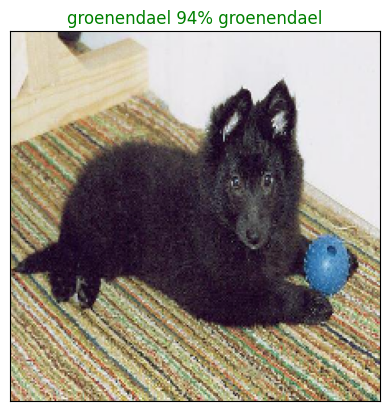

In [ ]:
plot_pred(prediction_probabilities=predictions,labels=val_labels,images=val_images,n=77)

In [ ]:
#now we have got one function to visualize our models top prediction,lets make another to view our models top 10 predictions
#this function wil:
# * take an input of predictions probabilities array and a ground truth array and an integer
# * find the prediction using 'get_pred_label()'
# * find the top 10:
    # *prediction probabilities indexes
    # *prediction probabilities values
    # *prediction labels
#plot the top 10 prediction probability values abd labels,coloring the true label green

In [ ]:
def plot_pred_conf(prediction_probabilities,labels,n=1):
  """
  plus the top 10 highest prediction confidence along with the true label for sample n
  """
  pred_prob,true_label=prediction_probabilities[n],labels[n]
  #get the predicted label
  pred_label=get_pred_label(pred_prob)
  #find the top 10 prediction confidence indexes
  top_10_pred_indexes=pred_prob.argsort()[-10:][::-1]
  #find the top 10 predictions confidence values
  top_10_pred_values=pred_prob[top_10_pred_indexes]
  #find the top 10 prediction labels
  top_10_pred_labels=np.array(unique_breeds)[top_10_pred_indexes]
  #setup plot
  top_plot=plt.bar(np.arange(len(top_10_pred_labels)),top_10_pred_values,color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),labels=top_10_pred_labels,rotation="vertical")
  #change color of true label
  if np.isin(true_label,top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels==true_label)].set_color("green")
  else:
    pass

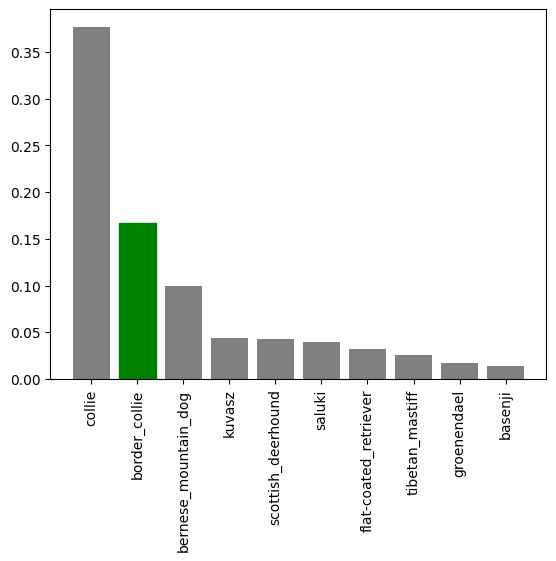

In [ ]:
plot_pred_conf(prediction_probabilities=predictions,labels=val_labels,n=9)

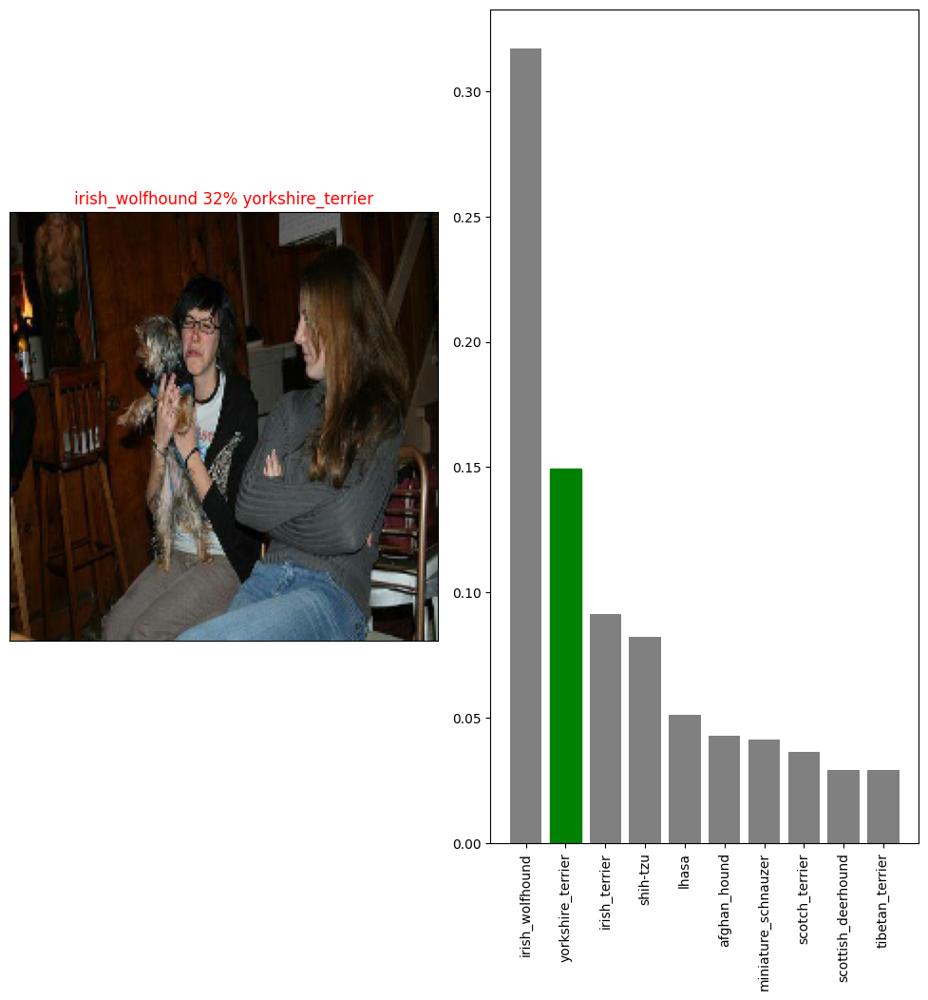

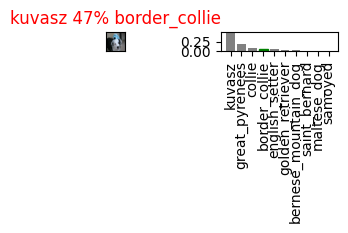

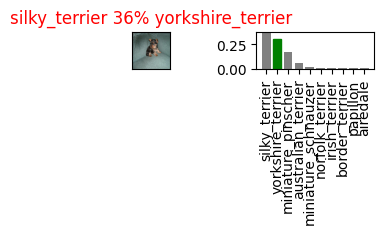

/tmp/ipykernel_54550/1304356656.py:12: UserWarning: Tight layout not applied. tight_layout cannot make Axes height small enough to accommodate all Axes decorations.
  plt.tight_layout(h_pad=1.0)


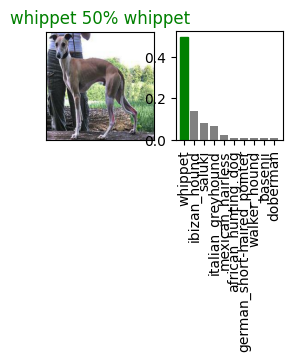

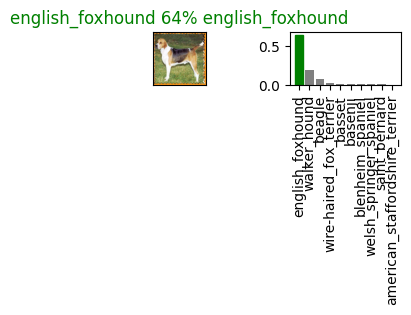

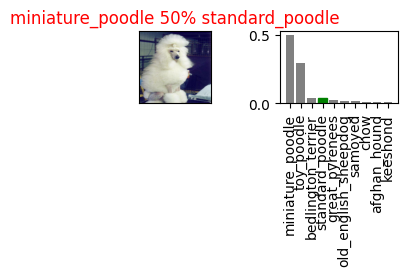

In [ ]:
#lets check out a few predictions and their different values
i_multiplier=10
num_rows=3
num_cols=2
num_images=num_rows*num_cols
plt.figure(figsize=(10*num_cols,10*num_rows))
for i in range(num_images):
  plt.subplot(num_rows,2*num_cols,2*i+1)
  plot_pred(prediction_probabilities=predictions,labels=val_labels,images=val_images,n=i+i_multiplier)
  plt.subplot(num_rows,2*num_cols,2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,labels=val_labels,n=i+i_multiplier)
  plt.tight_layout(h_pad=1.0)
  plt.show()


In [ ]:
#challenge:
#how would u create a confusion matrix with our models predictions and true labels?

In [ ]:
import os
import datetime
def save_model(model, suffix=None):
    """
    saves a given model in a models directory and appends a suffix(string)
    """
    # create a model directory pathname with current time
    modeldir = os.path.join("drive/My Drive/dog vision/data/models", datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))

    if suffix is not None:
        model_path = modeldir + "_" + suffix + ".h5"  # save format of model
    else:
        model_path = modeldir + ".h5"

    # ensure directory exists
    os.makedirs(os.path.dirname(modeldir), exist_ok=True)

    print(f"saving model to: {model_path}...")
    model.save(model_path)
    return model_path


In [ ]:
import tensorflow as tf
import tensorflow_hub as hub

# Load trained model
def load_model(model_path):

    print(f"Loading model from: {model_path}")

    model = tf.keras.models.load_model(
        model_path,
        custom_objects={
            "KerasLayer": hub.KerasLayer
        },
        compile=False
    )

    return model

In [ ]:
#save our model trained on 1000 images
save_model(model,suffix="1000-image-mobilenetv2-Adam")

saving model to: drive/My Drive/dog vision/data/models/20260515-191129_1000-image-mobilenetv2-Adam.h5...


/usr/local/lib/python3.12/dist-packages/tf_keras/src/engine/training.py:3098: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native TF-Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'drive/My Drive/dog vision/data/models/20260515-191129_1000-image-mobilenetv2-Adam.h5'

In [ ]:
#import tensorflow_hub as hub
#from tensorflow.keras.models import load_model
#loaded_1000_image_model=load_model('drive/My Drive/dog vision/data/models/20250701-182635_1000-image-mobilenetv2-Adam.keras',custom_objects={'KerasLayer': hub.KerasLayer})

In [ ]:
import keras, tensorflow as tf, tensorflow_hub as hub
print(keras.__version__, tf.__version__)

3.14.1 2.20.0


In [ ]:
!pip install -q tf_keras

In [ ]:
import tensorflow_hub as hub
import tf_keras

with tf_keras.utils.custom_object_scope({'KerasLayer': hub.KerasLayer}):
    loaded_1000_image_model = tf_keras.models.load_model(
        'drive/My Drive/dog vision/data/models/20260507-175004_1000-image-mobilenetv2-Adam.h5'
    )

print("Model loaded successfully!")
loaded_1000_image_model.summary()

Model loaded successfully!
Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer_1 (KerasLayer)  (None, 1280)              2257984   
                                                                 
 dense_1 (Dense)             (None, 120)               153720    
                                                                 
Total params: 2411704 (9.20 MB)
Trainable params: 153720 (600.47 KB)
Non-trainable params: 2257984 (8.61 MB)
_________________________________________________________________


In [ ]:
len(x),len(y)

(10222, 10222)

In [ ]:
x[:10]

['drive/MyDrive/dog vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/dog vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/dog vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/dog vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/dog vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/dog vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/dog vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/dog vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/dog vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/dog vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
len(x_train)

800

In [ ]:
#create a data batch with a full data set
full_data=tf.data.Dataset.from_tensor_slices((tf.constant(x),tf.constant(y)))
full_data_batches=full_data.shuffle(10000).batch(BATCH_SIZE)

In [ ]:
full_data=create_data_batches(x,y)

creating training data batches...


In [ ]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
import keras as k
import tf_keras as tfk

print(k.Sequential.__module__)   # Should NOT be used — keras.src.models.sequential
print(tfk.Sequential.__module__) # Should be — tf_keras.src.models.sequential

keras.src.models.sequential
tf_keras.src.engine.sequential


In [ ]:
#create a model for full model
full_model=create_model()

Building model with: [224, 224, 3] 120 https://tfhub.dev/google/tf2-preview/mobilenet_v2/feature_vector/4


In [ ]:
import tf_keras as keras

# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()
full_model_early_stopping = keras.callbacks.EarlyStopping(monitor="accuracy", patience=3)

In [ ]:
import os

# Verify the drive is mounted
print(os.path.exists('/content/drive/MyDrive'))

# Check what's in your dog vision folder
print(os.listdir('/content/drive/MyDrive/dog vision'))

# Check if train folder exists
print(os.path.exists('/content/drive/MyDrive/dog vision/train'))

True
['test', 'train', 'dog-breed-identification.zip', 'dog-breed-identification.zip (Unzipped Files) (2)', 'labels.csv', 'dog-breed-identification.zip (Unzipped Files) (1)', 'dog-breed-identification.zip (Unzipped Files)', 'test-20250613T073328Z-1-001.zip', 'Untitled.zip - ZIP Extractor_files', 'train-20250613T074048Z-1-001.zip', 'data', '.ipynb_checkpoints', 'models']
True


In [ ]:
# 1. Make sure Drive is mounted
from google.colab import drive
drive.mount('/content/drive')

# 2. Check your data path variable — should be absolute
print(full_data)  # or however your dataset path is defined

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>


In [ ]:
print(x_train[:3])  # or full_X, or whatever holds your image paths

['drive/MyDrive/dog vision/train/00bee065dcec471f26394855c5c2f3de.jpg', 'drive/MyDrive/dog vision/train/0d2f9e12a2611d911d91a339074c8154.jpg', 'drive/MyDrive/dog vision/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg']


In [ ]:
import os
print(os.path.exists("/content/drive/MyDrive/dog vision/train/806cbcc0362d78eabe9930ccd9b1c184.jpg"))

# Also check total file count
print(len(os.listdir("/content/drive/MyDrive/dog vision/train/")))
print(len(x))  # Compare with number of paths

False
10186
10222


In [ ]:
import numpy as np

# Find which files exist
mask = [os.path.exists(path) for path in x]
print(f"Missing files: {sum(1 for m in mask if not m)}")

# Filter both x and y
x_clean = [path for path, exists in zip(x, mask) if exists]
y_clean = np.array(y)[np.array(mask)]

print(f"Before: {len(x)} | After: {len(x_clean)}")

# Rebuild and retrain
full_data = create_data_batches(x_clean, y_clean)

full_model.fit(
    x=full_data,
    epochs=NUM_EPOCHS,
    callbacks=[full_model_tensorboard, full_model_early_stopping]
)

Missing files: 36
Before: 10222 | After: 10186
creating training data batches...
Epoch 1/100
319/319 [==============================] - 169s 520ms/step - loss: 1.3485 - accuracy: 0.6752
Epoch 2/100
319/319 [==============================] - 48s 149ms/step - loss: 0.4164 - accuracy: 0.8792
Epoch 3/100
319/319 [==============================] - 48s 150ms/step - loss: 0.2573 - accuracy: 0.9340
Epoch 4/100
319/319 [==============================] - 48s 150ms/step - loss: 0.1768 - accuracy: 0.9647
Epoch 5/100
319/319 [==============================] - 48s 150ms/step - loss: 0.1256 - accuracy: 0.9794
Epoch 6/100
319/319 [==============================] - 48s 149ms/step - loss: 0.0920 - accuracy: 0.9879
Epoch 7/100
319/319 [==============================] - 48s 149ms/step - loss: 0.0707 - accuracy: 0.9932
Epoch 8/100
319/319 [==============================] - 47s 148ms/step - loss: 0.0545 - accuracy: 0.9961
Epoch 9/100
319/319 [==============================] - 48s 150ms/step - loss: 0.0443 -

In [ ]:
save_model(full_model,suffix="full-image-set-mobilenetv2-Adam")

saving model to: drive/My Drive/dog vision/data/models/20260515-200101_full-image-set-mobilenetv2-Adam.h5...


/usr/local/lib/python3.12/dist-packages/tf_keras/src/engine/training.py:3098: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native TF-Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'drive/My Drive/dog vision/data/models/20260515-200101_full-image-set-mobilenetv2-Adam.h5'

In [ ]:
import tensorflow_hub as hub
import tf_keras

with tf_keras.utils.custom_object_scope({'KerasLayer': hub.KerasLayer}):
    loaded_full_model = tf_keras.models.load_model(
        '/content/drive/MyDrive/dog vision/data/models/20260515-200101_full-image-set-mobilenetv2-Adam.h5'
    )

print("Model loaded successfully!")
loaded_full_model.summary()

Model loaded successfully!
Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer_6 (KerasLayer)  (None, 1280)              2257984   
                                                                 
 dense_3 (Dense)             (None, 120)               153720    
                                                                 
Total params: 2411704 (9.20 MB)
Trainable params: 153720 (600.47 KB)
Non-trainable params: 2257984 (8.61 MB)
_________________________________________________________________


In [ ]:
#make predictions on the trained model
#since our model has been trained on images in the form of tensor batches ,to make predictions on the test data, we will have to get it into the sdame format.

In [ ]:
#to make prediction on the test data:
#get the test image filenames
#convert the file name into test data batches

In [ ]:
test_path='/content/drive/MyDrive/dog vision/test/'
test_filenames=[test_path+fname for fname in os.listdir(test_path)]
test_filenames[:10]

['/content/drive/MyDrive/dog vision/test/ddfe1bb4884e83421872030ac62835f1.jpg',
 '/content/drive/MyDrive/dog vision/test/e381c5fcf1420985b20117e4bc7d38cd.jpg',
 '/content/drive/MyDrive/dog vision/test/e5a89b25873ada7aaafec0de1af86cb1.jpg',
 '/content/drive/MyDrive/dog vision/test/e63da7cff68f6a5e452bb73cdbd93ad3.jpg',
 '/content/drive/MyDrive/dog vision/test/e423b91111a1c5b52cc1026086f263f2.jpg',
 '/content/drive/MyDrive/dog vision/test/de59703200e1b19b520033e76dea9b62.jpg',
 '/content/drive/MyDrive/dog vision/test/e241bfdd5cc6154698394905abaa0d76.jpg',
 '/content/drive/MyDrive/dog vision/test/e702ddff98bd0b05ab200ffb43fb080a.jpg',
 '/content/drive/MyDrive/dog vision/test/e48e4d9137c69e69f54f85907c061172.jpg',
 '/content/drive/MyDrive/dog vision/test/ddfbebe13aa8fba30f347c58466215df.jpg']

In [ ]:
len(test_filenames)

10348

In [ ]:
#create test data batch
test_data=create_data_batches(test_filenames,test_data=True)

creating test data batches...


In [ ]:
test_data


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
#make predictions on test data batch
test_predictions=loaded_full_model.predict(test_data,verbose=1)

324/324 [==============================] - 2778s 9s/step


In [ ]:
#save predictions(numpy array) to csv file(for access later)
np.savetxt("/content/drive/MyDrive/dog vision/preds_array.csv",test_predictions,delimiter=",")

In [ ]:
#load predictioms from csv file
test_predictions=np.loadtxt("/content/drive/MyDrive/dog vision/preds_array.csv",delimiter=",")

In [ ]:
test_predictions[:10]

array([[1.01768740e-06, 1.71286013e-06, 1.54719226e-06, ...,
        7.56912050e-06, 1.41911269e-05, 1.42831894e-04],
       [4.37478000e-08, 7.27102724e-06, 1.12421378e-06, ...,
        7.94538209e-05, 2.99150457e-07, 5.77031415e-07],
       [1.69855877e-04, 6.14904775e-06, 5.61273017e-04, ...,
        8.87579517e-07, 3.54577821e-07, 2.65850383e-03],
       ...,
       [3.92239308e-04, 8.37952575e-06, 3.27687235e-06, ...,
        4.56170164e-05, 6.36382247e-05, 8.35747633e-04],
       [1.17713439e-08, 3.99056344e-09, 9.99146938e-01, ...,
        5.76591049e-07, 2.62338484e-11, 3.58778429e-09],
       [1.92639749e-09, 2.49061460e-09, 1.69933063e-08, ...,
        1.40234519e-07, 8.30493207e-07, 2.20679610e-07]])

In [ ]:
test_predictions.shape

(10348, 120)

In [ ]:
##preparing test dataset predictionsd for kaggle

#create a panda dataframe with empty columns

preds_df=pd.DataFrame(columns=["id"]+list(unique_breeds))

In [ ]:
test_filenames

['/content/drive/MyDrive/dog vision/test/ddfe1bb4884e83421872030ac62835f1.jpg',
 '/content/drive/MyDrive/dog vision/test/e381c5fcf1420985b20117e4bc7d38cd.jpg',
 '/content/drive/MyDrive/dog vision/test/e5a89b25873ada7aaafec0de1af86cb1.jpg',
 '/content/drive/MyDrive/dog vision/test/e63da7cff68f6a5e452bb73cdbd93ad3.jpg',
 '/content/drive/MyDrive/dog vision/test/e423b91111a1c5b52cc1026086f263f2.jpg',
 '/content/drive/MyDrive/dog vision/test/de59703200e1b19b520033e76dea9b62.jpg',
 '/content/drive/MyDrive/dog vision/test/e241bfdd5cc6154698394905abaa0d76.jpg',
 '/content/drive/MyDrive/dog vision/test/e702ddff98bd0b05ab200ffb43fb080a.jpg',
 '/content/drive/MyDrive/dog vision/test/e48e4d9137c69e69f54f85907c061172.jpg',
 '/content/drive/MyDrive/dog vision/test/ddfbebe13aa8fba30f347c58466215df.jpg',
 '/content/drive/MyDrive/dog vision/test/e5b13519aa192a386dc0c5dd7d096e70.jpg',
 '/content/drive/MyDrive/dog vision/test/ecd186a42dd0ec3f78aa3d4fa56b8ea0.jpg',
 '/content/drive/MyDrive/dog vision/test

In [ ]:
#append test image id to prediction data fame
test_path

'/content/drive/MyDrive/dog vision/test/'

In [ ]:
test_ids=[os.path.splitext(path)[0] for path in os.listdir(test_path)]
test_ids

['ddfe1bb4884e83421872030ac62835f1',
 'e381c5fcf1420985b20117e4bc7d38cd',
 'e5a89b25873ada7aaafec0de1af86cb1',
 'e63da7cff68f6a5e452bb73cdbd93ad3',
 'e423b91111a1c5b52cc1026086f263f2',
 'de59703200e1b19b520033e76dea9b62',
 'e241bfdd5cc6154698394905abaa0d76',
 'e702ddff98bd0b05ab200ffb43fb080a',
 'e48e4d9137c69e69f54f85907c061172',
 'ddfbebe13aa8fba30f347c58466215df',
 'e5b13519aa192a386dc0c5dd7d096e70',
 'ecd186a42dd0ec3f78aa3d4fa56b8ea0',
 'efdd2006f173de50417a1a9ee170194b',
 'ef4501591ee2433e06ff5312df879593',
 'e816f0027a2c6348dbf12b79c70541bc',
 'f0b37b4b6d1452125b4cb91f08008298',
 'eee7c863af47e22f285f8aeb80adb4b9',
 'eb61a828e939eb633c1811f283d15647',
 'ee4c8303084840f4fa8ef6cc434dca91',
 'ed67035dba2de274aa95556038113c40',
 'eda4e3377eb5ad8a73026c08c76a613d',
 'f16ce30657f7dec9cf08597bbce2ffdb',
 'f232ed4d2958c9b13ec8922933a852e4',
 'eaa65260eb9a2f7d3b5484ac97962788',
 'f398e8ff747bfbb95f4aa7660608fc4f',
 'f09826fc9cb9aa425caae5f8aaaa8bef',
 'e967dd3dc67352cc2525c8283bf2751d',
 

In [ ]:
os.path.splitext(test_filenames[0])

('/content/drive/MyDrive/dog vision/test/ddfe1bb4884e83421872030ac62835f1',
 '.jpg')

In [ ]:
preds_df["id"]=test_ids

In [ ]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,ddfe1bb4884e83421872030ac62835f1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,e381c5fcf1420985b20117e4bc7d38cd,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,e5a89b25873ada7aaafec0de1af86cb1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e63da7cff68f6a5e452bb73cdbd93ad3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,e423b91111a1c5b52cc1026086f263f2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
#add the prediction probabilitiers to eacgh dog breed column
preds_df[list(unique_breeds)]=test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,ddfe1bb4884e83421872030ac62835f1,1.017687e-06,1.712860e-06,1.547192e-06,7.161155e-08,2.815649e-06,3.000127e-05,2.465061e-06,2.804377e-07,3.187872e-06,...,1.493608e-05,2.884505e-06,1.781170e-07,1.292563e-05,2.289781e-08,3.666992e-03,4.051725e-08,7.569120e-06,1.419113e-05,1.428319e-04
1,e381c5fcf1420985b20117e4bc7d38cd,4.374780e-08,7.271027e-06,1.124214e-06,2.140724e-06,2.821300e-07,1.690131e-05,3.659002e-09,1.254519e-06,3.446738e-06,...,1.138271e-07,3.901079e-08,6.525497e-03,3.087758e-05,1.435672e-05,6.086076e-05,4.660718e-10,7.945382e-05,2.991505e-07,5.770314e-07
2,e5a89b25873ada7aaafec0de1af86cb1,1.698559e-04,6.149048e-06,5.612730e-04,1.036821e-06,2.186634e-08,6.040118e-06,1.099027e-05,1.016710e-04,2.317282e-06,...,1.007581e-04,1.313375e-06,1.369807e-08,6.747443e-07,3.453058e-10,2.271550e-07,1.940802e-05,8.875795e-07,3.545778e-07,2.658504e-03
3,e63da7cff68f6a5e452bb73cdbd93ad3,4.164248e-07,1.407980e-08,2.854137e-08,1.001409e-08,2.595659e-09,1.271188e-05,9.166034e-07,4.649672e-05,1.476790e-10,...,1.468960e-08,5.002002e-06,3.362820e-09,2.132524e-07,7.694505e-09,8.576104e-08,4.804198e-06,5.346451e-06,1.057292e-05,2.081308e-08
4,e423b91111a1c5b52cc1026086f263f2,3.382766e-10,1.620185e-08,8.493024e-10,1.342156e-08,2.996772e-07,2.816148e-12,1.028975e-10,3.067501e-08,1.995903e-06,...,2.628251e-11,1.574343e-09,5.218726e-06,4.599757e-07,2.142861e-05,1.199267e-10,1.597170e-12,1.335471e-06,6.010865e-10,3.951045e-11


In [ ]:
preds_df.to_csv("/content/drive/My Drive/dog vision/full_model_submission_1_mobilenetv2.csv",index=False)
#save our prediction dataframe to csv for submission

In [ ]:
#to amke predictions on custom images we will

custom_path="/content/drive/MyDrive/dog vision/my-dog-photos/"
custom_image_paths=[custom_path+fname for fname in os.listdir(custom_path)]
custom_image_paths

['/content/drive/MyDrive/dog vision/my-dog-photos/labrador.jpg',
 '/content/drive/MyDrive/dog vision/my-dog-photos/images.jpg',
 '/content/drive/MyDrive/dog vision/my-dog-photos/download.jpg']

In [ ]:
os.listdir(custom_path)

['labrador.jpg', 'images.jpg', 'download.jpg']

In [ ]:
#turn custom images into batch dataset
custom_data=create_data_batches(custom_image_paths,test_data=True)


creating test data batches...


In [ ]:
#make prediction on custom data
custom_preds=loaded_full_model.predict(custom_data)

1/1 [==============================] - 1s 1s/step


In [ ]:
custom_preds.shape

(3, 120)

In [ ]:
##get cuastom image prediction labels
custom_pred_labels=[get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]

In [ ]:
custom_pred_labels

['labrador_retriever', 'golden_retriever', 'german_shepherd']

In [ ]:
#get custom images
custom_images=[]
#loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

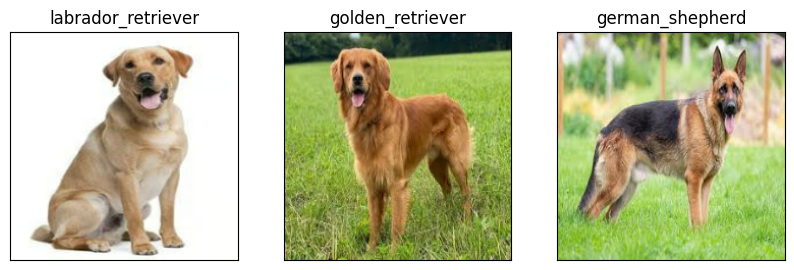

In [ ]:
#check custom image predictions
plt.figure(figsize=(10,10))
for i,image in enumerate(custom_images):
  plt.subplot(1,len(custom_images),i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)
